**SegResNet, FedAvg, ISLES'24**

In [1]:
#!pip install monai nibabel torch torchvision torchmetrics -q

In [2]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from monai.transforms import LoadImaged, EnsureChannelFirstd, Compose, ResizeWithPadOrCropd, NormalizeIntensityd, Orientationd, Spacingd, CropForegroundd, RandCropByPosNegLabeld
from monai.networks.nets import SegResNet
from monai.losses import DiceLoss
from monai.metrics import DiceMetric, HausdorffDistanceMetric
from monai.data import list_data_collate
from monai.inferers import SlidingWindowInferer

from glob import glob
import copy
#from google.colab import drive

import random
import nibabel as nib
import numpy as np

from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt
from tqdm import tqdm
import warnings
import shutil

In [3]:
#supress warnings for cleaner console output
warnings.filterwarnings("ignore", category=FutureWarning, module="monai")

In [4]:
# Mount Google Drive
# from google.colab import drive
# drive.mount('/content/drive')

data_dir = "D:/F25-156/ISLES24 Split Preprocessed"
print(data_dir)

D:/F25-156/ISLES24 Split Preprocessed


In [5]:
#save checkpoint and tensorboard logs in drive
checkpoint_dir = "D:/F25-156/SegResNet/Federated_SegResNet_checkpoints"
log_dir = "D:/F25-156/SegResNet/Federated_SegResNet_logs"

# Remove old directories if they exist
if os.path.exists(checkpoint_dir):
    shutil.rmtree(checkpoint_dir)

if os.path.exists(log_dir):
    shutil.rmtree(log_dir)

# Recreate directories
os.makedirs(checkpoint_dir)
os.makedirs(log_dir)

writer = SummaryWriter(log_dir=log_dir)
print(f"Checkpoints will be saved to: {checkpoint_dir}")
print(f"TensorBoard logs will be saved to: {log_dir}")

# %load_ext tensorboard
# %tensorboard --logdir "D:/F25-156/SegResNet/Federated_SegResNet_logs"

Checkpoints will be saved to: D:/F25-156/SegResNet/Federated_SegResNet_checkpoints
TensorBoard logs will be saved to: D:/F25-156/SegResNet/Federated_SegResNet_logs


In [6]:
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(42)

In [7]:
print(torch.__version__)
print("CUDA version:", torch.version.cuda)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

2.5.1+cu121
CUDA version: 12.1
CUDA available: True
GPU: NVIDIA RTX A4000


**MONAI Preprocessing Transforms**

In [8]:
# target_shape = (128, 128, 128)

# transform = Compose([
#     LoadImaged(keys=["image", "label"]),
    
#     EnsureChannelFirstd(keys=["image", "label"]),
    
#     Orientationd(keys=["image", "label"], axcodes="RAS"),

#     Spacingd(
#         keys=["image", "label"],
#         pixdim=(1.0, 1.0, 1.0),
#         mode=("bilinear", "nearest")
#     ),

#     # ⭐ Crop based on image, applied to both
#     CropForegroundd(
#         keys=["image", "label"],
#         source_key="image",
#     ),

#     # ⭐ Make uniform shape
#     ResizeWithPadOrCropd(
#         keys=["image", "label"],
#         spatial_size=target_shape
#     ),

#     # Only normalize image
#     NormalizeIntensityd(keys=["image"], nonzero=True)
# ])

#now minimal pre processing is required
transform = Compose([
    LoadImaged(keys=["image", "label"]),
    EnsureChannelFirstd(keys=["image", "label"]),
])

**Dataset Class**

In [9]:
def load_dwi_mask_pairs(base_path):
    dwi_files = sorted(glob(os.path.join(base_path, "DWI", "*.nii*")))
    mask_files = sorted(glob(os.path.join(base_path, "masks", "*.nii*")))
    assert len(dwi_files) == len(mask_files), f"Mismatch in {base_path}"
    return dwi_files, mask_files


**Load Files and Apply MONAI Transforms**

In [10]:
class ISLESDataset(Dataset):
    def __init__(self, dwi_files, mask_files, transform=None):
        assert len(dwi_files) == len(mask_files)

        self.dwi_files = dwi_files
        self.mask_files = mask_files
        self.transform = transform

    def __len__(self):
        return len(self.dwi_files)

    def __getitem__(self, idx):
        data = {
            "image": self.dwi_files[idx],
            "label": self.mask_files[idx]
        }

        if self.transform:
            data = self.transform(data)

        image = data["image"].float()
        mask = data["label"].long()

        return {
            "image": image,
            "mask": mask
        }

**Split into “Clients” (Federated Simulation)**


Client 0
Original samples: 50 | Preprocessed samples: 50

🔵 RAW SAMPLES
Sample 40 | Image shape: (512, 512, 83) | Mask shape: (512, 512, 83) | Mask values: tensor([0., 1.], dtype=torch.float64)


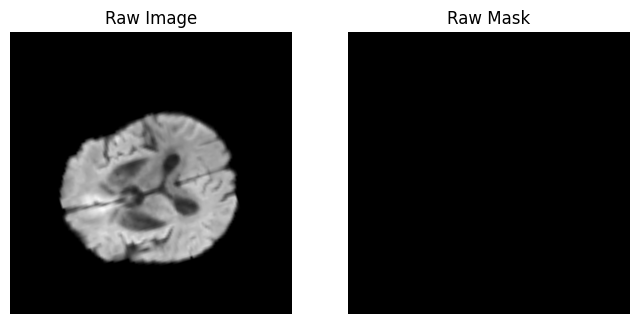

Sample 7 | Image shape: (512, 553, 70) | Mask shape: (512, 553, 70) | Mask values: tensor([0., 1.], dtype=torch.float64)


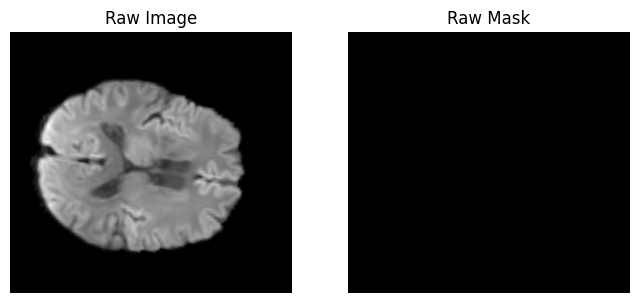


🟢 PREPROCESSED SAMPLES
Sample 40 | Image shape: (128, 128, 128) | Mask shape: (128, 128, 128) | Mask values: tensor([0])


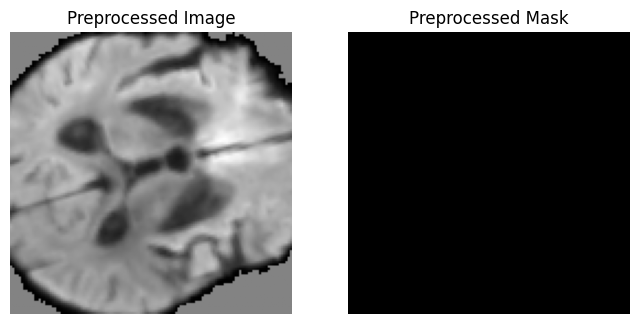

Sample 7 | Image shape: (128, 128, 128) | Mask shape: (128, 128, 128) | Mask values: tensor([0, 1])


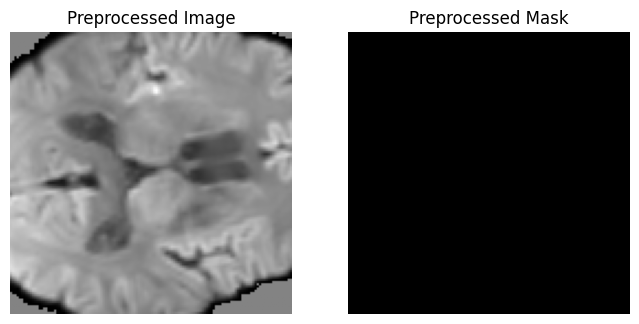


Client 0 dataset size: 50

Client 1
Original samples: 50 | Preprocessed samples: 50

🔵 RAW SAMPLES
Sample 1 | Image shape: (512, 587, 69) | Mask shape: (512, 587, 69) | Mask values: tensor([0., 1.], dtype=torch.float64)


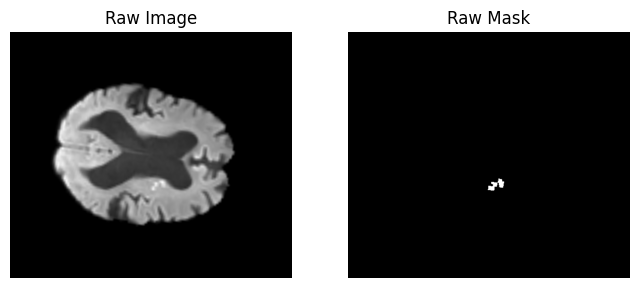

Sample 47 | Image shape: (512, 587, 69) | Mask shape: (512, 587, 69) | Mask values: tensor([0., 1.], dtype=torch.float64)


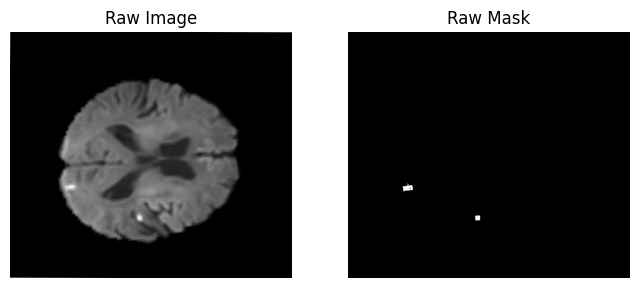


🟢 PREPROCESSED SAMPLES
Sample 1 | Image shape: (128, 128, 128) | Mask shape: (128, 128, 128) | Mask values: tensor([0, 1])


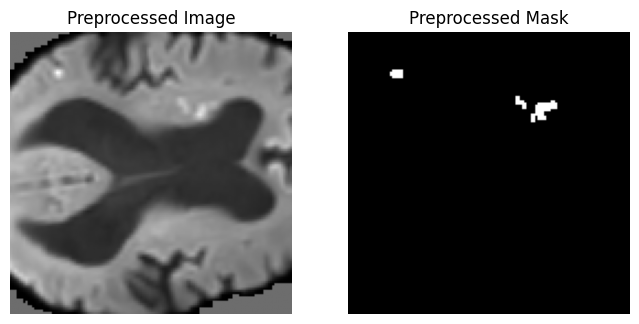

Sample 47 | Image shape: (128, 128, 128) | Mask shape: (128, 128, 128) | Mask values: tensor([0, 1])


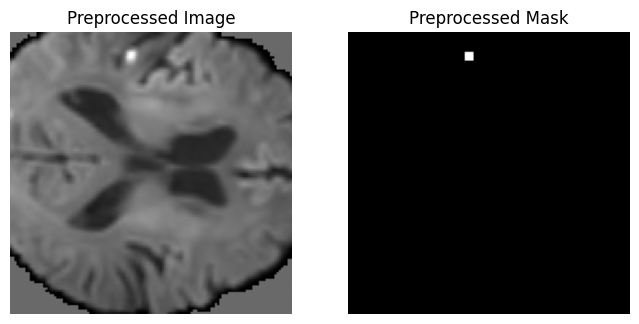


Client 1 dataset size: 50


In [11]:

original_root = "D:/F25-156/ISLES24 Split"
processed_root = "D:/F25-156/ISLES24 Split Preprocessed"

num_clients = 2
client_datasets = []

# -----------------------------
# Loop over clients
# -----------------------------
for i in range(num_clients):

    print("\n" + "="*60)
    print(f"Client {i}")
    print("="*60)

    # -----------------------------
    # ORIGINAL (raw split)
    # -----------------------------
    orig_img_dir = os.path.join(original_root, "train", f"client_{i}", "DWI")
    orig_mask_dir = os.path.join(original_root, "train", f"client_{i}", "masks")

    dwi_files = sorted(glob(os.path.join(orig_img_dir, "*.nii*")))
    mask_files = sorted(glob(os.path.join(orig_mask_dir, "*.nii*")))

    # -----------------------------
    # PREPROCESSED
    # -----------------------------
    proc_img_dir = os.path.join(processed_root, "train", f"client_{i}", "DWI")
    proc_mask_dir = os.path.join(processed_root, "train", f"client_{i}", "masks")

    proc_dwi = sorted(glob(os.path.join(proc_img_dir, "*.nii*")))
    proc_mask = sorted(glob(os.path.join(proc_mask_dir, "*.nii*")))

    print(f"Original samples: {len(dwi_files)} | Preprocessed samples: {len(proc_dwi)}")

    # -----------------------------
    # Pick random samples
    # -----------------------------
    sample_indices = random.sample(range(len(dwi_files)), k=2)

    # =========================================================
    # RAW VISUALIZATION
    # =========================================================
    print("\n🔵 RAW SAMPLES")
    for idx in sample_indices:

        img = nib.load(dwi_files[idx]).get_fdata()
        mask = nib.load(mask_files[idx]).get_fdata()

        print(
            f"Sample {idx} | Image shape: {img.shape} | Mask shape: {mask.shape} | "
            f"Mask values: {torch.unique(torch.tensor(mask))}"
        )

        mid = img.shape[2] // 2

        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img[:,:,mid], cmap="gray")
        plt.title("Raw Image")
        plt.axis("off")

        plt.subplot(1,2,2)
        plt.imshow(mask[:,:,mid], cmap="gray")
        plt.title("Raw Mask")
        plt.axis("off")
        plt.show()

    # =========================================================
    # PREPROCESSED VISUALIZATION
    # =========================================================
    print("\n🟢 PREPROCESSED SAMPLES")

    # dataset uses ONLY minimal transform
    ds = ISLESDataset(
        dwi_files=proc_dwi,
        mask_files=proc_mask,
        transform=transform,
    )

    client_datasets.append(ds)

    for idx in sample_indices:

        sample = ds[idx]

        img_proc = sample["image"][0].numpy()
        mask_proc = sample["mask"][0].numpy()

        print(
            f"Sample {idx} | Image shape: {img_proc.shape} | "
            f"Mask shape: {mask_proc.shape} | Mask values: {torch.unique(sample['mask'])}"
        )

        mid = img_proc.shape[2] // 2

        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img_proc[:,:,mid], cmap="gray")
        plt.title("Preprocessed Image")
        plt.axis("off")

        plt.subplot(1,2,2)
        plt.imshow(mask_proc[:,:,mid], cmap="gray")
        plt.title("Preprocessed Mask")
        plt.axis("off")
        plt.show()

    print(f"\nClient {i} dataset size: {len(ds)}")

**Validation Set**

In [12]:
val_dwi, val_masks = load_dwi_mask_pairs(os.path.join(data_dir, "val"))

val_dataset = ISLESDataset(
    dwi_files=val_dwi,
    mask_files=val_masks,
    transform=transform,
)

val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

print("Validation samples:", len(val_dataset))

Validation samples: 20


In [13]:
print("CUDA version:", torch.version.cuda)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

CUDA version: 12.1
CUDA available: True
GPU: NVIDIA RTX A4000


In [14]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cuda:0


## SegResNet

In [15]:
def create_model():
    model = SegResNet(
        spatial_dims=3,
        in_channels=1,          # DWI is single channel
        out_channels=1,         # Binary lesion mask
        init_filters=16,        # similar starting capacity as UNet
        blocks_down=(1, 2, 2, 4),
        blocks_up=(1, 1, 1),
        dropout_prob=0.2
    ).to(device)
    print(model)
    return model

**Client Class**

In [16]:
class Client:
    def __init__(self, client_id, dataset, device):
        self.id = client_id
        self.loader = DataLoader(dataset, batch_size=1, shuffle=True, collate_fn=list_data_collate)
        self.device = device
        self.model = create_model().to(device)
        self.optimizer = optim.Adam(self.model.parameters(), lr=1e-4)
        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + 0.3*self.bce_loss(y_pred, y_true)

    def get_parameters(self):
        return {k: v.cpu().clone() for k, v in self.model.state_dict().items()}

    def set_parameters(self, parameters):
        self.model.load_state_dict(parameters)


    def train_epochs(self, num_epochs=1):
        self.model.train()
        total_loss = 0
        
        # Progress bar for epochs
        for epoch in tqdm(range(1, num_epochs + 1), desc=f"Client {self.id} Epochs", leave=True):
            epoch_loss = 0

            for batch in self.loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                self.optimizer.zero_grad()
                outputs = self.model(images)
                loss = self.loss_fn(outputs, masks)
                loss.backward()
                self.optimizer.step()

                total_loss += loss.item()
                epoch_loss += loss.item()

                # Metrics for monitoring
                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

            # Compute metrics at the end of the epoch
            mean_dice = self.dice_metric.aggregate().item()
            # mean_hd95 = self.hd_metric.aggregate().item()
            try:
                mean_hd95 = self.hd_metric.aggregate().item()
            except ValueError:
                mean_hd95 = float('nan')  # or 0
            mean_iou = mean_dice / (2 - mean_dice)

            # Print per-epoch metrics
            print(f"Client {self.id} | Epoch {epoch}/{num_epochs} | "
                  f"Loss: {epoch_loss/len(self.loader):.4f} | Dice: {mean_dice:.4f} | "
                  f"IoU: {mean_iou:.4f} | HD95: {mean_hd95:.4f}")

            # Reset metrics for next epoch
            self.dice_metric.reset()
            self.hd_metric.reset()

        # Average loss across all epochs
        avg_loss = total_loss / (len(self.loader) * num_epochs)

        # Return last epoch metrics
        return avg_loss, mean_dice, mean_iou, mean_hd95

**Server Class**

In [17]:
class Server:
    def __init__(self, val_loader, device):
        self.device = device
        self.global_model = create_model().to(device)
        self.val_loader = val_loader

        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

        self.best_dice = 0.0

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + \
               0.3*self.bce_loss(y_pred, y_true)

    def aggregate(self, client_params_list):
        new_params = {}

        for key in client_params_list[0].keys():
            param = client_params_list[0][key]

            # Only average floating point tensors
            if torch.is_floating_point(param):
                new_params[key] = param.clone()

                for i in range(1, len(client_params_list)):
                    # prevent device inconsistency- if client tensors are on different devices (CPU vs GPU), this can crash:
                    new_params[key] += client_params_list[i][key].to(param.device)

                new_params[key] /= len(client_params_list)

            else:
                # Copy non-float params (int, bool, etc.) directly
                new_params[key] = param.clone()

        self.global_model.load_state_dict(new_params)
    def distribute(self, clients):
        global_params = self.global_model.state_dict()
        for client in clients:
            client.set_parameters(global_params)

    def validate(self):
        self.global_model.eval()
        val_loss = 0

        with torch.no_grad():
            for batch in self.val_loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                outputs = self.global_model(images)
                loss = self.loss_fn(outputs, masks)
                val_loss += loss.item()

                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

        avg_loss = val_loss / len(self.val_loader)
        mean_dice = self.dice_metric.aggregate().item()
        # mean_hd95 = self.hd_metric.aggregate().item()
        try:
            mean_hd95 = self.hd_metric.aggregate().item()
        except ValueError:
            mean_hd95 = float('nan')  # or 0
        mean_iou = mean_dice / (2 - mean_dice)

        self.dice_metric.reset()
        self.hd_metric.reset()

        # Save best global model
        if mean_dice > self.best_dice:
            self.best_dice = mean_dice
            torch.save({
                "model_state_dict": self.global_model.state_dict(),
                "dice": mean_dice
            }, "best_global_model.pth")
            print(f"Best global model updated with Dice={mean_dice:.4f}")


        return avg_loss, mean_dice, mean_iou, mean_hd95

In [18]:
#create client and server objects
clients = [
    Client(client_id=i, dataset=client_datasets[i], device=device)
    for i in range(num_clients)
]

server = Server(val_loader=val_loader, device=device)

SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
      )
      (1): ResBlock(
        (norm1): GroupNorm(8, 32, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 32, eps=1e-05, a

**Federated Training loop**

In [ ]:
communication_rounds = 10  # upper bound
local_epochs = 20
dice_threshold = 0.001

# ---- Added early stopping tracking ----
no_improve_rounds = 0
patience = 2   # stop if Dice does not improve for 2 rounds
# --------------------------------------

global_history = {"dice": [], "loss": [], "iou": [], "hd95": []}
client_history = {client.id: {"loss": [], "dice": [], "iou": [], "hd95": []} for client in clients}

previous_dice = 0

for round_num in range(1, communication_rounds + 1):

    print(f"\n--- Communication Round {round_num} ---")

    # ---- Distribute global model ----
    server.distribute(clients)

    client_params = []

    # ---- Local Training ----
    for client in tqdm(clients, desc="Clients Training", leave=False):

        # train_epochs already runs for `local_epochs`
        train_loss, train_dice, train_iou, train_hd95 = client.train_epochs(local_epochs)

        # Save per-client metrics
        client_history[client.id]["loss"].append(train_loss)
        client_history[client.id]["dice"].append(train_dice)
        client_history[client.id]["iou"].append(train_iou)
        client_history[client.id]["hd95"].append(train_hd95)

        # TensorBoard logging
        writer.add_scalar(f"Client_{client.id}/Loss", train_loss, round_num)
        writer.add_scalar(f"Client_{client.id}/Dice", train_dice, round_num)
        writer.add_scalar(f"Client_{client.id}/IoU", train_iou, round_num)
        writer.add_scalar(f"Client_{client.id}/HD95", train_hd95, round_num)


        client_params.append(client.get_parameters())

        tqdm.write(f"Client {client.id} | Loss={train_loss:.4f} | Dice={train_dice:.4f} | IoU={train_iou:.4f} | HD95={train_hd95:.4f}")
    # ---- Aggregate client models ----
    server.aggregate(client_params)

    # ---- Validation on global model ----
    val_loss, val_dice, val_iou, val_hd95 = server.validate()

    global_history["loss"].append(val_loss)
    global_history["dice"].append(val_dice)
    global_history["iou"].append(val_iou)
    global_history["hd95"].append(val_hd95)

    # TensorBoard logging
    writer.add_scalar("Global/Val_Loss", val_loss, round_num)
    writer.add_scalar("Global/Val_Dice", val_dice, round_num)
    writer.add_scalar("Global/Val_IoU", val_iou, round_num)
    writer.add_scalar("Global/Val_HD95", val_hd95, round_num)


    print(f"Global | Val Loss={val_loss:.4f} | Dice={val_dice:.4f} | IoU={val_iou:.4f} | HD95={val_hd95:.4f}")

    # Save checkpoint of current round
    checkpoint_path = os.path.join(checkpoint_dir, f"federated_round{round_num}.pth")
    torch.save({
        "round": round_num,
        "global_model_state_dict": server.global_model.state_dict(),
        "global_val_loss": val_loss,
        "global_val_dice": val_dice,
        "global_val_iou": val_iou,
        "global_val_hd95": val_hd95,
        "client_history": client_history
    }, checkpoint_path)
    print(f"Checkpoint saved for round {round_num} at {checkpoint_path}")

     # ---- Early stopping check based on validation Dice ----
    if val_dice > previous_dice + dice_threshold:
        no_improve_rounds = 0
    else:
        no_improve_rounds += 1
        print(f"No significant Dice improvement for {no_improve_rounds} round(s)")

    if no_improve_rounds >= patience:
        print(f"Early stopping triggered at round {round_num} (no Dice improvement for {patience} rounds)")
        break
    # -------------------------------------------------------

    previous_dice = val_dice

writer.close()


--- Communication Round 1 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.8065 | Dice: 0.2311 | IoU: 0.1306 | HD95: 79.7519


Client 0 | Epoch 2/20 | Loss: 0.7737 | Dice: 0.2786 | IoU: 0.1618 | HD95: 76.6654


Client 0 | Epoch 3/20 | Loss: 0.7652 | Dice: 0.3093 | IoU: 0.1830 | HD95: 73.8641


Client 0 | Epoch 4/20 | Loss: 0.7591 | Dice: 0.2979 | IoU: 0.1750 | HD95: 72.5822


Client 0 | Epoch 5/20 | Loss: 0.7513 | Dice: 0.3310 | IoU: 0.1984 | HD95: 69.9561


Client 0 | Epoch 6/20 | Loss: 0.7424 | Dice: 0.3649 | IoU: 0.2231 | HD95: 66.3766


Client 0 | Epoch 7/20 | Loss: 0.7362 | Dice: 0.3844 | IoU: 0.2379 | HD95: 66.9020


Client 0 | Epoch 8/20 | Loss: 0.7286 | Dice: 0.3893 | IoU: 0.2417 | HD95: 59.4523


Client 0 | Epoch 9/20 | Loss: 0.7203 | Dice: 0.4488 | IoU: 0.2893 | HD95: 60.0397


Client 0 | Epoch 10/20 | Loss: 0.7146 | Dice: 0.4441 | IoU: 0.2855 | HD95: 54.0382


Client 0 | Epoch 11/20 | Loss: 0.7069 | Dice: 0.4713 | IoU: 0.3083 | HD95: 53.7634


Client 0 | Epoch 12/20 | Loss: 0.7070 | Dice: 0.4323 | IoU: 0.2757 | HD95: 62.4187


Client 0 | Epoch 13/20 | Loss: 0.6972 | Dice: 0.4796 | IoU: 0.3154 | HD95: 46.8422


Client 0 | Epoch 14/20 | Loss: 0.6947 | Dice: 0.4684 | IoU: 0.3058 | HD95: 52.4609


Client 0 | Epoch 15/20 | Loss: 0.6863 | Dice: 0.4876 | IoU: 0.3224 | HD95: 50.2967


Client 0 | Epoch 16/20 | Loss: 0.6824 | Dice: 0.4956 | IoU: 0.3295 | HD95: 49.1366


Client 0 | Epoch 17/20 | Loss: 0.6750 | Dice: 0.5103 | IoU: 0.3425 | HD95: 44.9085


Client 0 | Epoch 18/20 | Loss: 0.6674 | Dice: 0.5507 | IoU: 0.3799 | HD95: 42.7766


Client 0 | Epoch 19/20 | Loss: 0.6619 | Dice: 0.5449 | IoU: 0.3745 | HD95: 41.0527


Clients Training:  50%|█████     | 1/2 [08:14<08:14, 494.25s/it]

Client 0 | Epoch 20/20 | Loss: 0.6564 | Dice: 0.5619 | IoU: 0.3907 | HD95: 39.2309
Client 0 | Loss=0.7166 | Dice=0.5619 | IoU=0.3907 | HD95=39.2309


Client 1 | Epoch 1/20 | Loss: 0.8167 | Dice: 0.1630 | IoU: 0.0888 | HD95: 75.8429


Client 1 | Epoch 2/20 | Loss: 0.7912 | Dice: 0.2312 | IoU: 0.1307 | HD95: 77.0348


Client 1 | Epoch 3/20 | Loss: 0.7785 | Dice: 0.2554 | IoU: 0.1464 | HD95: 75.5205


Client 1 | Epoch 4/20 | Loss: 0.7733 | Dice: 0.2564 | IoU: 0.1471 | HD95: 72.7269


Client 1 | Epoch 5/20 | Loss: 0.7654 | Dice: 0.2615 | IoU: 0.1504 | HD95: 75.2639


Client 1 | Epoch 6/20 | Loss: 0.7556 | Dice: 0.3386 | IoU: 0.2038 | HD95: 68.7625


Client 1 | Epoch 7/20 | Loss: 0.7494 | Dice: 0.3482 | IoU: 0.2108 | HD95: 64.9350


Client 1 | Epoch 8/20 | Loss: 0.7431 | Dice: 0.3686 | IoU: 0.2259 | HD95: 61.6832


Client 1 | Epoch 9/20 | Loss: 0.7349 | Dice: 0.4059 | IoU: 0.2547 | HD95: 56.4046


Client 1 | Epoch 10/20 | Loss: 0.7279 | Dice: 0.4408 | IoU: 0.2827 | HD95: 52.9133


Client 1 | Epoch 11/20 | Loss: 0.7247 | Dice: 0.4282 | IoU: 0.2724 | HD95: 55.8953


Client 1 | Epoch 12/20 | Loss: 0.7178 | Dice: 0.4434 | IoU: 0.2848 | HD95: 48.7764


Client 1 | Epoch 13/20 | Loss: 0.7153 | Dice: 0.4309 | IoU: 0.2746 | HD95: 57.1209


Client 1 | Epoch 14/20 | Loss: 0.7108 | Dice: 0.4431 | IoU: 0.2846 | HD95: 50.7953


Client 1 | Epoch 15/20 | Loss: 0.7001 | Dice: 0.5091 | IoU: 0.3415 | HD95: 43.0575


Client 1 | Epoch 16/20 | Loss: 0.6951 | Dice: 0.5202 | IoU: 0.3515 | HD95: 39.2484


Client 1 | Epoch 17/20 | Loss: 0.6929 | Dice: 0.5091 | IoU: 0.3415 | HD95: 39.4776


Client 1 | Epoch 18/20 | Loss: 0.6878 | Dice: 0.4714 | IoU: 0.3084 | HD95: 40.2838


Client 1 | Epoch 19/20 | Loss: 0.6806 | Dice: 0.5206 | IoU: 0.3519 | HD95: 39.2388


Client 1 Epochs: 100%|██████████| 20/20 [07:47<00:00, 23.39s/it]
                                                                

Client 1 | Epoch 20/20 | Loss: 0.6749 | Dice: 0.5656 | IoU: 0.3943 | HD95: 31.8932
Client 1 | Loss=0.7318 | Dice=0.5656 | IoU=0.3943 | HD95=31.8932


Best global model updated with Dice=0.5260
Global | Val Loss=0.6387 | Dice=0.5260 | IoU=0.3568 | HD95=42.0019
Checkpoint saved for round 1 at D:/F25-156/SegResNet/Federated_SegResNet_checkpoints\federated_round1.pth

--- Communication Round 2 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.6593 | Dice: 0.4610 | IoU: 0.2995 | HD95: 52.4828


Client 0 | Epoch 2/20 | Loss: 0.6507 | Dice: 0.5311 | IoU: 0.3616 | HD95: 49.4751


Client 0 | Epoch 3/20 | Loss: 0.6474 | Dice: 0.5049 | IoU: 0.3377 | HD95: 43.6615


Client 0 | Epoch 4/20 | Loss: 0.6373 | Dice: 0.5690 | IoU: 0.3976 | HD95: 34.0681


Client 0 | Epoch 5/20 | Loss: 0.6284 | Dice: 0.5798 | IoU: 0.4083 | HD95: 37.9013


Client 0 | Epoch 6/20 | Loss: 0.6275 | Dice: 0.5438 | IoU: 0.3734 | HD95: 44.2541


Client 0 | Epoch 7/20 | Loss: 0.6201 | Dice: 0.5793 | IoU: 0.4077 | HD95: 37.0522


Client 0 | Epoch 8/20 | Loss: 0.6258 | Dice: 0.4942 | IoU: 0.3282 | HD95: 54.5468


Client 0 | Epoch 9/20 | Loss: 0.6095 | Dice: 0.5714 | IoU: 0.4000 | HD95: 40.7238


Client 0 | Epoch 10/20 | Loss: 0.6027 | Dice: 0.5931 | IoU: 0.4216 | HD95: 39.3810


Client 0 | Epoch 11/20 | Loss: 0.5960 | Dice: 0.6177 | IoU: 0.4469 | HD95: 33.5823


Client 0 | Epoch 12/20 | Loss: 0.5910 | Dice: 0.6075 | IoU: 0.4363 | HD95: 31.2101


Client 0 | Epoch 13/20 | Loss: 0.5826 | Dice: 0.6225 | IoU: 0.4519 | HD95: 31.7586


Client 0 | Epoch 14/20 | Loss: 0.5759 | Dice: 0.6425 | IoU: 0.4733 | HD95: 24.9042


Client 0 | Epoch 15/20 | Loss: 0.5690 | Dice: 0.6469 | IoU: 0.4781 | HD95: 28.2548


Client 0 | Epoch 16/20 | Loss: 0.5640 | Dice: 0.6380 | IoU: 0.4684 | HD95: 35.1478


Client 0 | Epoch 17/20 | Loss: 0.5618 | Dice: 0.6040 | IoU: 0.4326 | HD95: 35.0312


Client 0 | Epoch 18/20 | Loss: 0.5528 | Dice: 0.6294 | IoU: 0.4592 | HD95: 30.1412


Client 0 | Epoch 19/20 | Loss: 0.5448 | Dice: 0.6659 | IoU: 0.4991 | HD95: 27.0840


Clients Training:  50%|█████     | 1/2 [07:15<07:15, 435.63s/it]

Client 0 | Epoch 20/20 | Loss: 0.5395 | Dice: 0.6514 | IoU: 0.4830 | HD95: 29.3246
Client 0 | Loss=0.5993 | Dice=0.6514 | IoU=0.4830 | HD95=29.3246


Client 1 | Epoch 1/20 | Loss: 0.6799 | Dice: 0.4678 | IoU: 0.3053 | HD95: 46.6323


Client 1 | Epoch 2/20 | Loss: 0.6706 | Dice: 0.5186 | IoU: 0.3501 | HD95: 42.2124


Client 1 | Epoch 3/20 | Loss: 0.6680 | Dice: 0.4906 | IoU: 0.3250 | HD95: 45.4942


Client 1 | Epoch 4/20 | Loss: 0.6585 | Dice: 0.5637 | IoU: 0.3924 | HD95: 33.5704


Client 1 | Epoch 5/20 | Loss: 0.6538 | Dice: 0.5461 | IoU: 0.3756 | HD95: 37.1929


Client 1 | Epoch 6/20 | Loss: 0.6521 | Dice: 0.5173 | IoU: 0.3489 | HD95: 42.0245


Client 1 | Epoch 7/20 | Loss: 0.6415 | Dice: 0.5725 | IoU: 0.4010 | HD95: 27.7819


Client 1 | Epoch 8/20 | Loss: 0.6352 | Dice: 0.6112 | IoU: 0.4401 | HD95: 28.7361


Client 1 | Epoch 9/20 | Loss: 0.6297 | Dice: 0.6071 | IoU: 0.4359 | HD95: 22.5831


Client 1 | Epoch 10/20 | Loss: 0.6245 | Dice: 0.6095 | IoU: 0.4384 | HD95: 25.6041


Client 1 | Epoch 11/20 | Loss: 0.6175 | Dice: 0.6245 | IoU: 0.4540 | HD95: 21.3957


Client 1 | Epoch 12/20 | Loss: 0.6129 | Dice: 0.6204 | IoU: 0.4497 | HD95: 24.6216


Client 1 | Epoch 13/20 | Loss: 0.6074 | Dice: 0.6199 | IoU: 0.4492 | HD95: 19.3585


Client 1 | Epoch 14/20 | Loss: 0.6005 | Dice: 0.6355 | IoU: 0.4657 | HD95: 22.6984


Client 1 | Epoch 15/20 | Loss: 0.5943 | Dice: 0.6384 | IoU: 0.4689 | HD95: 22.0830


Client 1 | Epoch 16/20 | Loss: 0.5895 | Dice: 0.6258 | IoU: 0.4554 | HD95: 23.0692


Client 1 | Epoch 17/20 | Loss: 0.5841 | Dice: 0.6256 | IoU: 0.4552 | HD95: 20.3902


Client 1 | Epoch 18/20 | Loss: 0.5764 | Dice: 0.6426 | IoU: 0.4734 | HD95: 22.0129


Client 1 | Epoch 19/20 | Loss: 0.5696 | Dice: 0.6468 | IoU: 0.4780 | HD95: 24.5446


Client 1 Epochs: 100%|██████████| 20/20 [07:04<00:00, 21.21s/it]
                                                                

Client 1 | Epoch 20/20 | Loss: 0.5623 | Dice: 0.6641 | IoU: 0.4971 | HD95: 15.3505
Client 1 | Loss=0.6214 | Dice=0.6641 | IoU=0.4971 | HD95=15.3505


Best global model updated with Dice=0.6371
Global | Val Loss=0.5220 | Dice=0.6371 | IoU=0.4674 | HD95=18.3444
Checkpoint saved for round 2 at D:/F25-156/SegResNet/Federated_SegResNet_checkpoints\federated_round2.pth

--- Communication Round 3 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.5345 | Dice: 0.6295 | IoU: 0.4593 | HD95: 34.7948


Client 0 | Epoch 2/20 | Loss: 0.5392 | Dice: 0.5804 | IoU: 0.4088 | HD95: 41.0168


Client 0 | Epoch 3/20 | Loss: 0.5293 | Dice: 0.5881 | IoU: 0.4165 | HD95: 36.4907


Client 0 | Epoch 4/20 | Loss: 0.5332 | Dice: 0.5429 | IoU: 0.3726 | HD95: 39.2405


Client 0 | Epoch 5/20 | Loss: 0.5314 | Dice: 0.5462 | IoU: 0.3757 | HD95: 41.9046


Client 0 | Epoch 6/20 | Loss: 0.5069 | Dice: 0.6306 | IoU: 0.4605 | HD95: 28.9387


Client 0 | Epoch 7/20 | Loss: 0.5007 | Dice: 0.6217 | IoU: 0.4511 | HD95: 32.3171


Client 0 | Epoch 8/20 | Loss: 0.4933 | Dice: 0.6295 | IoU: 0.4593 | HD95: 31.0784


Client 0 | Epoch 9/20 | Loss: 0.4814 | Dice: 0.6751 | IoU: 0.5095 | HD95: 25.3494


Client 0 | Epoch 10/20 | Loss: 0.4752 | Dice: 0.6784 | IoU: 0.5133 | HD95: 26.4505


Client 0 | Epoch 11/20 | Loss: 0.4682 | Dice: 0.6680 | IoU: 0.5015 | HD95: 23.4369


Client 0 | Epoch 12/20 | Loss: 0.4641 | Dice: 0.6727 | IoU: 0.5068 | HD95: 25.5288


Client 0 | Epoch 13/20 | Loss: 0.4525 | Dice: 0.6938 | IoU: 0.5312 | HD95: 21.6959


Client 0 | Epoch 14/20 | Loss: 0.4477 | Dice: 0.6904 | IoU: 0.5272 | HD95: 25.5686


Client 0 | Epoch 15/20 | Loss: 0.4377 | Dice: 0.6983 | IoU: 0.5364 | HD95: 23.5744


Client 0 | Epoch 16/20 | Loss: 0.4279 | Dice: 0.7183 | IoU: 0.5604 | HD95: 17.8407


Client 0 | Epoch 17/20 | Loss: 0.4216 | Dice: 0.7191 | IoU: 0.5614 | HD95: 20.6737


Client 0 | Epoch 18/20 | Loss: 0.4158 | Dice: 0.7181 | IoU: 0.5601 | HD95: 20.5935


Client 0 | Epoch 19/20 | Loss: 0.4091 | Dice: 0.7158 | IoU: 0.5574 | HD95: 21.0139


Clients Training:  50%|█████     | 1/2 [06:48<06:48, 408.50s/it]

Client 0 | Epoch 20/20 | Loss: 0.4053 | Dice: 0.7127 | IoU: 0.5537 | HD95: 27.6310
Client 0 | Loss=0.4738 | Dice=0.7127 | IoU=0.5537 | HD95=27.6310


Client 1 | Epoch 1/20 | Loss: 0.5779 | Dice: 0.5611 | IoU: 0.3900 | HD95: 39.1382


Client 1 | Epoch 2/20 | Loss: 0.5885 | Dice: 0.4754 | IoU: 0.3118 | HD95: 53.1731


Client 1 | Epoch 3/20 | Loss: 0.5559 | Dice: 0.5846 | IoU: 0.4130 | HD95: 28.6264


Client 1 | Epoch 4/20 | Loss: 0.5462 | Dice: 0.6194 | IoU: 0.4486 | HD95: 29.0901


Client 1 | Epoch 5/20 | Loss: 0.5355 | Dice: 0.6626 | IoU: 0.4955 | HD95: 21.2208


Client 1 | Epoch 6/20 | Loss: 0.5288 | Dice: 0.6440 | IoU: 0.4749 | HD95: 22.0161


Client 1 | Epoch 7/20 | Loss: 0.5251 | Dice: 0.6402 | IoU: 0.4708 | HD95: 26.2860


Client 1 | Epoch 8/20 | Loss: 0.5222 | Dice: 0.6135 | IoU: 0.4425 | HD95: 24.6008


Client 1 | Epoch 9/20 | Loss: 0.5103 | Dice: 0.6487 | IoU: 0.4801 | HD95: 24.7684


Client 1 | Epoch 10/20 | Loss: 0.4973 | Dice: 0.6922 | IoU: 0.5293 | HD95: 17.3435


Client 1 | Epoch 11/20 | Loss: 0.4894 | Dice: 0.6833 | IoU: 0.5190 | HD95: 12.4307


Client 1 | Epoch 12/20 | Loss: 0.4793 | Dice: 0.7042 | IoU: 0.5434 | HD95: 15.3604


Client 1 | Epoch 13/20 | Loss: 0.4706 | Dice: 0.7030 | IoU: 0.5420 | HD95: 15.2849


Client 1 | Epoch 14/20 | Loss: 0.4629 | Dice: 0.7196 | IoU: 0.5620 | HD95: 12.5424


Client 1 | Epoch 15/20 | Loss: 0.4582 | Dice: 0.6886 | IoU: 0.5251 | HD95: 14.7879


Client 1 | Epoch 16/20 | Loss: 0.4485 | Dice: 0.7025 | IoU: 0.5415 | HD95: 13.7554


Client 1 | Epoch 17/20 | Loss: 0.4446 | Dice: 0.7068 | IoU: 0.5466 | HD95: 15.9663


Client 1 | Epoch 18/20 | Loss: 0.4326 | Dice: 0.7173 | IoU: 0.5592 | HD95: 17.1366


Client 1 | Epoch 19/20 | Loss: 0.4219 | Dice: 0.7270 | IoU: 0.5711 | HD95: 11.8502


Client 1 Epochs: 100%|██████████| 20/20 [06:52<00:00, 20.61s/it]
                                                                

Client 1 | Epoch 20/20 | Loss: 0.4253 | Dice: 0.6935 | IoU: 0.5308 | HD95: 16.5536
Client 1 | Loss=0.4961 | Dice=0.6935 | IoU=0.5308 | HD95=16.5536


Global | Val Loss=0.3969 | Dice=0.6360 | IoU=0.4662 | HD95=20.1214
Checkpoint saved for round 3 at D:/F25-156/SegResNet/Federated_SegResNet_checkpoints\federated_round3.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 4 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.4428 | Dice: 0.5932 | IoU: 0.4217 | HD95: 35.7326


Client 0 | Epoch 2/20 | Loss: 0.4321 | Dice: 0.5802 | IoU: 0.4086 | HD95: 42.3656


Client 0 | Epoch 3/20 | Loss: 0.4046 | Dice: 0.6475 | IoU: 0.4787 | HD95: 28.9474


Client 0 | Epoch 4/20 | Loss: 0.3880 | Dice: 0.6837 | IoU: 0.5194 | HD95: 30.2528


Client 0 | Epoch 5/20 | Loss: 0.3860 | Dice: 0.6738 | IoU: 0.5081 | HD95: 28.6355


Client 0 | Epoch 6/20 | Loss: 0.3753 | Dice: 0.6780 | IoU: 0.5129 | HD95: 25.8499


Client 0 | Epoch 7/20 | Loss: 0.3581 | Dice: 0.7230 | IoU: 0.5662 | HD95: 21.2904


Client 0 | Epoch 8/20 | Loss: 0.3477 | Dice: 0.7423 | IoU: 0.5902 | HD95: 19.3109


Client 0 | Epoch 9/20 | Loss: 0.3414 | Dice: 0.7438 | IoU: 0.5921 | HD95: 15.8752


Client 0 | Epoch 10/20 | Loss: 0.3326 | Dice: 0.7540 | IoU: 0.6052 | HD95: 15.2884


Client 0 | Epoch 11/20 | Loss: 0.3270 | Dice: 0.7614 | IoU: 0.6148 | HD95: 12.2815


Client 0 | Epoch 12/20 | Loss: 0.3222 | Dice: 0.7532 | IoU: 0.6041 | HD95: 17.6809


Client 0 | Epoch 13/20 | Loss: 0.3147 | Dice: 0.7635 | IoU: 0.6174 | HD95: 15.0881


Client 0 | Epoch 14/20 | Loss: 0.3093 | Dice: 0.7748 | IoU: 0.6323 | HD95: 11.7789


Client 0 | Epoch 15/20 | Loss: 0.3071 | Dice: 0.7564 | IoU: 0.6082 | HD95: 19.5536


Client 0 | Epoch 16/20 | Loss: 0.3025 | Dice: 0.7545 | IoU: 0.6057 | HD95: 15.6884


Client 0 | Epoch 17/20 | Loss: 0.2970 | Dice: 0.7632 | IoU: 0.6171 | HD95: 12.2360


Client 0 | Epoch 18/20 | Loss: 0.2985 | Dice: 0.7476 | IoU: 0.5969 | HD95: 15.5698


Client 0 | Epoch 19/20 | Loss: 0.2861 | Dice: 0.7747 | IoU: 0.6322 | HD95: 14.8581


Clients Training:  50%|█████     | 1/2 [06:38<06:38, 398.59s/it]

Client 0 | Epoch 20/20 | Loss: 0.2774 | Dice: 0.7812 | IoU: 0.6410 | HD95: 8.3854
Client 0 | Loss=0.3425 | Dice=0.7812 | IoU=0.6410 | HD95=8.3854


Client 1 | Epoch 1/20 | Loss: 0.4229 | Dice: 0.6899 | IoU: 0.5266 | HD95: 17.3175


Client 1 | Epoch 2/20 | Loss: 0.4077 | Dice: 0.7230 | IoU: 0.5662 | HD95: 11.1031


Client 1 | Epoch 3/20 | Loss: 0.4029 | Dice: 0.7172 | IoU: 0.5590 | HD95: 15.7555


Client 1 | Epoch 4/20 | Loss: 0.3911 | Dice: 0.7298 | IoU: 0.5745 | HD95: 14.6400


Client 1 | Epoch 5/20 | Loss: 0.3828 | Dice: 0.7310 | IoU: 0.5761 | HD95: 12.7762


Client 1 | Epoch 6/20 | Loss: 0.3761 | Dice: 0.7362 | IoU: 0.5826 | HD95: 10.8766


Client 1 | Epoch 7/20 | Loss: 0.3698 | Dice: 0.7345 | IoU: 0.5804 | HD95: 9.5586


Client 1 | Epoch 8/20 | Loss: 0.3637 | Dice: 0.7348 | IoU: 0.5807 | HD95: 10.9229


Client 1 | Epoch 9/20 | Loss: 0.3524 | Dice: 0.7456 | IoU: 0.5944 | HD95: 10.5701


Client 1 | Epoch 10/20 | Loss: 0.3437 | Dice: 0.7562 | IoU: 0.6080 | HD95: 8.4910


Client 1 | Epoch 11/20 | Loss: 0.3351 | Dice: 0.7630 | IoU: 0.6168 | HD95: 7.2745


Client 1 | Epoch 12/20 | Loss: 0.3287 | Dice: 0.7629 | IoU: 0.6167 | HD95: 7.9244


Client 1 | Epoch 13/20 | Loss: 0.3207 | Dice: 0.7659 | IoU: 0.6206 | HD95: 8.2111


Client 1 | Epoch 14/20 | Loss: 0.3163 | Dice: 0.7642 | IoU: 0.6184 | HD95: 7.8086


Client 1 | Epoch 15/20 | Loss: 0.3132 | Dice: 0.7613 | IoU: 0.6145 | HD95: 7.7860


Client 1 | Epoch 16/20 | Loss: 0.3091 | Dice: 0.7625 | IoU: 0.6161 | HD95: 10.3715


Client 1 | Epoch 17/20 | Loss: 0.3104 | Dice: 0.7449 | IoU: 0.5935 | HD95: 13.9049


Client 1 | Epoch 18/20 | Loss: 0.3157 | Dice: 0.7274 | IoU: 0.5716 | HD95: 12.4375


Client 1 | Epoch 19/20 | Loss: 0.2945 | Dice: 0.7650 | IoU: 0.6194 | HD95: 7.5197


Client 1 Epochs: 100%|██████████| 20/20 [06:36<00:00, 19.80s/it]
                                                                

Client 1 | Epoch 20/20 | Loss: 0.2827 | Dice: 0.7778 | IoU: 0.6364 | HD95: 6.4332
Client 1 | Loss=0.3470 | Dice=0.7778 | IoU=0.6364 | HD95=6.4332


Best global model updated with Dice=0.7062
Global | Val Loss=0.2997 | Dice=0.7062 | IoU=0.5458 | HD95=14.1072
Checkpoint saved for round 4 at D:/F25-156/SegResNet/Federated_SegResNet_checkpoints\federated_round4.pth

--- Communication Round 5 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2918 | Dice: 0.7398 | IoU: 0.5871 | HD95: 21.0913


Client 0 | Epoch 2/20 | Loss: 0.3232 | Dice: 0.6664 | IoU: 0.4997 | HD95: 24.6308


Client 0 | Epoch 3/20 | Loss: 0.3218 | Dice: 0.6626 | IoU: 0.4955 | HD95: 26.2014


Client 0 | Epoch 4/20 | Loss: 0.3033 | Dice: 0.6859 | IoU: 0.5219 | HD95: 28.4777


Client 0 | Epoch 5/20 | Loss: 0.2749 | Dice: 0.7457 | IoU: 0.5945 | HD95: 16.1269


Client 0 | Epoch 6/20 | Loss: 0.2765 | Dice: 0.7391 | IoU: 0.5862 | HD95: 15.5628


Client 0 | Epoch 7/20 | Loss: 0.2773 | Dice: 0.7214 | IoU: 0.5642 | HD95: 23.2970


Client 0 | Epoch 8/20 | Loss: 0.2565 | Dice: 0.7644 | IoU: 0.6187 | HD95: 16.0080


Client 0 | Epoch 9/20 | Loss: 0.2439 | Dice: 0.7835 | IoU: 0.6441 | HD95: 11.8926


Client 0 | Epoch 10/20 | Loss: 0.2368 | Dice: 0.7990 | IoU: 0.6653 | HD95: 8.8051


Client 0 | Epoch 11/20 | Loss: 0.2308 | Dice: 0.8049 | IoU: 0.6734 | HD95: 10.3936


Client 0 | Epoch 12/20 | Loss: 0.2359 | Dice: 0.7936 | IoU: 0.6579 | HD95: 13.3221


Client 0 | Epoch 13/20 | Loss: 0.2293 | Dice: 0.7980 | IoU: 0.6639 | HD95: 11.9801


Client 0 | Epoch 14/20 | Loss: 0.2278 | Dice: 0.7953 | IoU: 0.6602 | HD95: 10.3434


Client 0 | Epoch 15/20 | Loss: 0.2192 | Dice: 0.8021 | IoU: 0.6696 | HD95: 8.5127


Client 0 | Epoch 16/20 | Loss: 0.2253 | Dice: 0.7961 | IoU: 0.6613 | HD95: 13.1010


Client 0 | Epoch 17/20 | Loss: 0.2442 | Dice: 0.7489 | IoU: 0.5986 | HD95: 15.3858


Client 0 | Epoch 18/20 | Loss: 0.2843 | Dice: 0.6771 | IoU: 0.5118 | HD95: 20.9230


Client 0 | Epoch 19/20 | Loss: 0.2310 | Dice: 0.7621 | IoU: 0.6157 | HD95: 17.7760


Clients Training:  50%|█████     | 1/2 [06:30<06:30, 390.71s/it]

Client 0 | Epoch 20/20 | Loss: 0.2124 | Dice: 0.7974 | IoU: 0.6630 | HD95: 10.6902
Client 0 | Loss=0.2573 | Dice=0.7974 | IoU=0.6630 | HD95=10.6902


Client 1 | Epoch 1/20 | Loss: 0.2869 | Dice: 0.7663 | IoU: 0.6212 | HD95: 8.9380


Client 1 | Epoch 2/20 | Loss: 0.2905 | Dice: 0.7513 | IoU: 0.6016 | HD95: 12.0027


Client 1 | Epoch 3/20 | Loss: 0.2849 | Dice: 0.7577 | IoU: 0.6099 | HD95: 9.9613


Client 1 | Epoch 4/20 | Loss: 0.2756 | Dice: 0.7696 | IoU: 0.6255 | HD95: 7.7674


Client 1 | Epoch 5/20 | Loss: 0.2698 | Dice: 0.7747 | IoU: 0.6323 | HD95: 6.3611


Client 1 | Epoch 6/20 | Loss: 0.2603 | Dice: 0.7839 | IoU: 0.6446 | HD95: 6.1493


Client 1 | Epoch 7/20 | Loss: 0.2559 | Dice: 0.7861 | IoU: 0.6475 | HD95: 5.2031


Client 1 | Epoch 8/20 | Loss: 0.2515 | Dice: 0.7869 | IoU: 0.6487 | HD95: 5.3875


Client 1 | Epoch 9/20 | Loss: 0.2473 | Dice: 0.7899 | IoU: 0.6528 | HD95: 6.4571


Client 1 | Epoch 10/20 | Loss: 0.2431 | Dice: 0.7938 | IoU: 0.6581 | HD95: 5.1392


Client 1 | Epoch 11/20 | Loss: 0.2376 | Dice: 0.7970 | IoU: 0.6624 | HD95: 4.9186


Client 1 | Epoch 12/20 | Loss: 0.2347 | Dice: 0.7958 | IoU: 0.6609 | HD95: 5.0391


Client 1 | Epoch 13/20 | Loss: 0.2315 | Dice: 0.7956 | IoU: 0.6606 | HD95: 4.1610


Client 1 | Epoch 14/20 | Loss: 0.2449 | Dice: 0.7681 | IoU: 0.6235 | HD95: 11.2657


Client 1 | Epoch 15/20 | Loss: 0.2428 | Dice: 0.7702 | IoU: 0.6262 | HD95: 9.8138


Client 1 | Epoch 16/20 | Loss: 0.2303 | Dice: 0.7821 | IoU: 0.6421 | HD95: 6.8480


Client 1 | Epoch 17/20 | Loss: 0.2227 | Dice: 0.7956 | IoU: 0.6606 | HD95: 5.1146


Client 1 | Epoch 18/20 | Loss: 0.2162 | Dice: 0.8018 | IoU: 0.6692 | HD95: 3.8013


Client 1 | Epoch 19/20 | Loss: 0.2138 | Dice: 0.8020 | IoU: 0.6695 | HD95: 3.9955


Client 1 Epochs: 100%|██████████| 20/20 [06:30<00:00, 19.52s/it]
                                                                

Client 1 | Epoch 20/20 | Loss: 0.2121 | Dice: 0.8041 | IoU: 0.6723 | HD95: 4.2090
Client 1 | Loss=0.2476 | Dice=0.8041 | IoU=0.6723 | HD95=4.2090


Best global model updated with Dice=0.7137
Global | Val Loss=0.2460 | Dice=0.7137 | IoU=0.5548 | HD95=15.3480
Checkpoint saved for round 5 at D:/F25-156/SegResNet/Federated_SegResNet_checkpoints\federated_round5.pth

--- Communication Round 6 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2064 | Dice: 0.8070 | IoU: 0.6765 | HD95: 9.3861


Client 0 | Epoch 2/20 | Loss: 0.1994 | Dice: 0.8121 | IoU: 0.6837 | HD95: 7.8060


Client 0 | Epoch 3/20 | Loss: 0.2070 | Dice: 0.8064 | IoU: 0.6756 | HD95: 8.6964


Client 0 | Epoch 4/20 | Loss: 0.1994 | Dice: 0.8054 | IoU: 0.6743 | HD95: 8.8582


Client 0 | Epoch 5/20 | Loss: 0.2080 | Dice: 0.7924 | IoU: 0.6562 | HD95: 7.8939


Client 0 | Epoch 6/20 | Loss: 0.1932 | Dice: 0.8123 | IoU: 0.6839 | HD95: 8.4151


Client 0 | Epoch 7/20 | Loss: 0.1880 | Dice: 0.8158 | IoU: 0.6889 | HD95: 8.6225


Client 0 | Epoch 8/20 | Loss: 0.1859 | Dice: 0.8234 | IoU: 0.6998 | HD95: 5.3098


Client 0 | Epoch 9/20 | Loss: 0.1834 | Dice: 0.8209 | IoU: 0.6962 | HD95: 5.5916


Client 0 | Epoch 10/20 | Loss: 0.1764 | Dice: 0.8301 | IoU: 0.7096 | HD95: 4.8787


Client 0 | Epoch 11/20 | Loss: 0.1748 | Dice: 0.8286 | IoU: 0.7073 | HD95: 4.7960


Client 0 | Epoch 12/20 | Loss: 0.1743 | Dice: 0.8324 | IoU: 0.7129 | HD95: 4.0081


Client 0 | Epoch 13/20 | Loss: 0.1786 | Dice: 0.8177 | IoU: 0.6916 | HD95: 7.6038


Client 0 | Epoch 14/20 | Loss: 0.1777 | Dice: 0.8158 | IoU: 0.6889 | HD95: 8.4170


Client 0 | Epoch 15/20 | Loss: 0.1848 | Dice: 0.8140 | IoU: 0.6863 | HD95: 6.7357


Client 0 | Epoch 16/20 | Loss: 0.1761 | Dice: 0.8209 | IoU: 0.6962 | HD95: 5.4847


Client 0 | Epoch 17/20 | Loss: 0.1732 | Dice: 0.8271 | IoU: 0.7052 | HD95: 7.5064


Client 0 | Epoch 18/20 | Loss: 0.1697 | Dice: 0.8300 | IoU: 0.7094 | HD95: 8.6364


Client 0 | Epoch 19/20 | Loss: 0.1647 | Dice: 0.8333 | IoU: 0.7142 | HD95: 4.7228


Clients Training:  50%|█████     | 1/2 [06:20<06:20, 380.68s/it]

Client 0 | Epoch 20/20 | Loss: 0.1755 | Dice: 0.8139 | IoU: 0.6863 | HD95: 10.2777
Client 0 | Loss=0.1848 | Dice=0.8139 | IoU=0.6863 | HD95=10.2777


Client 1 | Epoch 1/20 | Loss: 0.2199 | Dice: 0.7893 | IoU: 0.6519 | HD95: 6.8643


Client 1 | Epoch 2/20 | Loss: 0.2154 | Dice: 0.7924 | IoU: 0.6562 | HD95: 4.8619


Client 1 | Epoch 3/20 | Loss: 0.2111 | Dice: 0.7969 | IoU: 0.6624 | HD95: 4.9977


Client 1 | Epoch 4/20 | Loss: 0.2066 | Dice: 0.8013 | IoU: 0.6684 | HD95: 5.4889


Client 1 | Epoch 5/20 | Loss: 0.2039 | Dice: 0.8038 | IoU: 0.6720 | HD95: 4.4255


Client 1 | Epoch 6/20 | Loss: 0.2057 | Dice: 0.7995 | IoU: 0.6660 | HD95: 4.5826


Client 1 | Epoch 7/20 | Loss: 0.2323 | Dice: 0.7550 | IoU: 0.6064 | HD95: 12.3046


Client 1 | Epoch 8/20 | Loss: 0.2300 | Dice: 0.7583 | IoU: 0.6107 | HD95: 13.1900


Client 1 | Epoch 9/20 | Loss: 0.2108 | Dice: 0.7855 | IoU: 0.6468 | HD95: 6.9975


Client 1 | Epoch 10/20 | Loss: 0.2007 | Dice: 0.7973 | IoU: 0.6629 | HD95: 4.9805


Client 1 | Epoch 11/20 | Loss: 0.1926 | Dice: 0.8091 | IoU: 0.6795 | HD95: 3.9291


Client 1 | Epoch 12/20 | Loss: 0.1910 | Dice: 0.8100 | IoU: 0.6807 | HD95: 3.8769


Client 1 | Epoch 13/20 | Loss: 0.1928 | Dice: 0.8046 | IoU: 0.6730 | HD95: 3.9444


Client 1 | Epoch 14/20 | Loss: 0.1891 | Dice: 0.8093 | IoU: 0.6798 | HD95: 3.7962


Client 1 | Epoch 15/20 | Loss: 0.1874 | Dice: 0.8103 | IoU: 0.6811 | HD95: 5.1534


Client 1 | Epoch 16/20 | Loss: 0.1842 | Dice: 0.8135 | IoU: 0.6856 | HD95: 4.0614


Client 1 | Epoch 17/20 | Loss: 0.1830 | Dice: 0.8134 | IoU: 0.6856 | HD95: 3.6777


Client 1 | Epoch 18/20 | Loss: 0.1811 | Dice: 0.8147 | IoU: 0.6873 | HD95: 3.6335


Client 1 | Epoch 19/20 | Loss: 0.1804 | Dice: 0.8154 | IoU: 0.6883 | HD95: 5.7796


Client 1 Epochs: 100%|██████████| 20/20 [06:24<00:00, 19.23s/it]
                                                                

Client 1 | Epoch 20/20 | Loss: 0.1851 | Dice: 0.8075 | IoU: 0.6771 | HD95: 6.4667
Client 1 | Loss=0.2002 | Dice=0.8075 | IoU=0.6771 | HD95=6.4667


Best global model updated with Dice=0.7149
Global | Val Loss=0.2244 | Dice=0.7149 | IoU=0.5564 | HD95=11.0253
Checkpoint saved for round 6 at D:/F25-156/SegResNet/Federated_SegResNet_checkpoints\federated_round6.pth

--- Communication Round 7 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.1925 | Dice: 0.7849 | IoU: 0.6460 | HD95: 9.5132


Client 0 | Epoch 2/20 | Loss: 0.2137 | Dice: 0.7456 | IoU: 0.5944 | HD95: 16.7722


Client 0 | Epoch 3/20 | Loss: 0.1919 | Dice: 0.7826 | IoU: 0.6428 | HD95: 11.6063


Client 0 | Epoch 4/20 | Loss: 0.1783 | Dice: 0.8077 | IoU: 0.6774 | HD95: 11.4277


Client 0 | Epoch 5/20 | Loss: 0.1662 | Dice: 0.8217 | IoU: 0.6974 | HD95: 7.3751


Client 0 | Epoch 6/20 | Loss: 0.1599 | Dice: 0.8338 | IoU: 0.7150 | HD95: 3.9537


Client 0 | Epoch 7/20 | Loss: 0.1619 | Dice: 0.8255 | IoU: 0.7028 | HD95: 4.4508


Client 0 | Epoch 8/20 | Loss: 0.1597 | Dice: 0.8337 | IoU: 0.7149 | HD95: 4.3789


Client 0 | Epoch 9/20 | Loss: 0.1570 | Dice: 0.8348 | IoU: 0.7164 | HD95: 5.9786


Client 0 | Epoch 10/20 | Loss: 0.1532 | Dice: 0.8370 | IoU: 0.7197 | HD95: 4.9580


Client 0 | Epoch 11/20 | Loss: 0.1492 | Dice: 0.8434 | IoU: 0.7292 | HD95: 3.3763


Client 0 | Epoch 12/20 | Loss: 0.1473 | Dice: 0.8444 | IoU: 0.7307 | HD95: 3.4440


Client 0 | Epoch 13/20 | Loss: 0.1531 | Dice: 0.8371 | IoU: 0.7198 | HD95: 3.5637


Client 0 | Epoch 14/20 | Loss: 0.1525 | Dice: 0.8312 | IoU: 0.7111 | HD95: 3.9920


Client 0 | Epoch 15/20 | Loss: 0.1498 | Dice: 0.8381 | IoU: 0.7213 | HD95: 4.9150


Client 0 | Epoch 16/20 | Loss: 0.1458 | Dice: 0.8422 | IoU: 0.7275 | HD95: 4.0105


Client 0 | Epoch 17/20 | Loss: 0.1525 | Dice: 0.8329 | IoU: 0.7136 | HD95: 6.6828


Client 0 | Epoch 18/20 | Loss: 0.1485 | Dice: 0.8367 | IoU: 0.7192 | HD95: 5.1313


Client 0 | Epoch 19/20 | Loss: 0.1505 | Dice: 0.8315 | IoU: 0.7116 | HD95: 5.7759


Clients Training:  50%|█████     | 1/2 [06:19<06:19, 379.18s/it]

Client 0 | Epoch 20/20 | Loss: 0.1438 | Dice: 0.8449 | IoU: 0.7314 | HD95: 3.7294
Client 0 | Loss=0.1614 | Dice=0.8449 | IoU=0.7314 | HD95=3.7294


Client 1 | Epoch 1/20 | Loss: 0.1878 | Dice: 0.8000 | IoU: 0.6666 | HD95: 4.9791


Client 1 | Epoch 2/20 | Loss: 0.1814 | Dice: 0.8082 | IoU: 0.6781 | HD95: 3.8514


Client 1 | Epoch 3/20 | Loss: 0.1804 | Dice: 0.8107 | IoU: 0.6817 | HD95: 4.4471


Client 1 | Epoch 4/20 | Loss: 0.1873 | Dice: 0.7989 | IoU: 0.6652 | HD95: 4.5032


Client 1 | Epoch 5/20 | Loss: 0.1787 | Dice: 0.8097 | IoU: 0.6802 | HD95: 3.7964


Client 1 | Epoch 6/20 | Loss: 0.1762 | Dice: 0.8129 | IoU: 0.6847 | HD95: 3.6821


Client 1 | Epoch 7/20 | Loss: 0.1736 | Dice: 0.8163 | IoU: 0.6896 | HD95: 3.7086


Client 1 | Epoch 8/20 | Loss: 0.1711 | Dice: 0.8184 | IoU: 0.6926 | HD95: 3.5583


Client 1 | Epoch 9/20 | Loss: 0.1699 | Dice: 0.8198 | IoU: 0.6946 | HD95: 3.5554


Client 1 | Epoch 10/20 | Loss: 0.1686 | Dice: 0.8221 | IoU: 0.6979 | HD95: 3.5109


Client 1 | Epoch 11/20 | Loss: 0.1681 | Dice: 0.8210 | IoU: 0.6963 | HD95: 3.6227


Client 1 | Epoch 12/20 | Loss: 0.1681 | Dice: 0.8213 | IoU: 0.6967 | HD95: 4.3956


Client 1 | Epoch 13/20 | Loss: 0.1708 | Dice: 0.8160 | IoU: 0.6892 | HD95: 5.5855


Client 1 | Epoch 14/20 | Loss: 0.1663 | Dice: 0.8227 | IoU: 0.6988 | HD95: 3.7135


Client 1 | Epoch 15/20 | Loss: 0.1635 | Dice: 0.8259 | IoU: 0.7035 | HD95: 3.3943


Client 1 | Epoch 16/20 | Loss: 0.1656 | Dice: 0.8221 | IoU: 0.6980 | HD95: 3.7126


Client 1 | Epoch 17/20 | Loss: 0.1638 | Dice: 0.8246 | IoU: 0.7016 | HD95: 3.4970


Client 1 | Epoch 18/20 | Loss: 0.1614 | Dice: 0.8271 | IoU: 0.7051 | HD95: 3.4400


Client 1 | Epoch 19/20 | Loss: 0.1590 | Dice: 0.8303 | IoU: 0.7099 | HD95: 3.2931


Client 1 Epochs: 100%|██████████| 20/20 [06:24<00:00, 19.22s/it]
                                                                

Client 1 | Epoch 20/20 | Loss: 0.1615 | Dice: 0.8261 | IoU: 0.7037 | HD95: 3.4944
Client 1 | Loss=0.1712 | Dice=0.8261 | IoU=0.7037 | HD95=3.4944


Best global model updated with Dice=0.7232
Global | Val Loss=0.2099 | Dice=0.7232 | IoU=0.5664 | HD95=11.3250
Checkpoint saved for round 7 at D:/F25-156/SegResNet/Federated_SegResNet_checkpoints\federated_round7.pth

--- Communication Round 8 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.1650 | Dice: 0.8063 | IoU: 0.6755 | HD95: 8.5041


Client 0 | Epoch 2/20 | Loss: 0.1822 | Dice: 0.7845 | IoU: 0.6454 | HD95: 17.8596


Client 0 | Epoch 3/20 | Loss: 0.1765 | Dice: 0.7907 | IoU: 0.6538 | HD95: 11.0823


Client 0 | Epoch 4/20 | Loss: 0.1727 | Dice: 0.7948 | IoU: 0.6595 | HD95: 10.2744


Client 0 | Epoch 5/20 | Loss: 0.1584 | Dice: 0.8192 | IoU: 0.6937 | HD95: 5.8457


Client 0 | Epoch 6/20 | Loss: 0.1513 | Dice: 0.8271 | IoU: 0.7052 | HD95: 3.8634


Client 0 | Epoch 7/20 | Loss: 0.1446 | Dice: 0.8383 | IoU: 0.7216 | HD95: 3.4757


Client 0 | Epoch 8/20 | Loss: 0.1415 | Dice: 0.8406 | IoU: 0.7251 | HD95: 3.3184


Client 0 | Epoch 9/20 | Loss: 0.1363 | Dice: 0.8500 | IoU: 0.7392 | HD95: 3.5064


Client 0 | Epoch 10/20 | Loss: 0.1341 | Dice: 0.8512 | IoU: 0.7410 | HD95: 3.0729


Client 0 | Epoch 11/20 | Loss: 0.1344 | Dice: 0.8507 | IoU: 0.7401 | HD95: 3.2368


Client 0 | Epoch 12/20 | Loss: 0.1341 | Dice: 0.8504 | IoU: 0.7398 | HD95: 2.8616


Client 0 | Epoch 13/20 | Loss: 0.1318 | Dice: 0.8525 | IoU: 0.7429 | HD95: 3.2504


Client 0 | Epoch 14/20 | Loss: 0.1304 | Dice: 0.8546 | IoU: 0.7461 | HD95: 4.1981


Client 0 | Epoch 15/20 | Loss: 0.1292 | Dice: 0.8567 | IoU: 0.7493 | HD95: 3.2845


Client 0 | Epoch 16/20 | Loss: 0.1309 | Dice: 0.8524 | IoU: 0.7428 | HD95: 3.2231


Client 0 | Epoch 17/20 | Loss: 0.1290 | Dice: 0.8552 | IoU: 0.7470 | HD95: 3.0431


Client 0 | Epoch 18/20 | Loss: 0.1284 | Dice: 0.8564 | IoU: 0.7489 | HD95: 3.1406


Client 0 | Epoch 19/20 | Loss: 0.1245 | Dice: 0.8608 | IoU: 0.7557 | HD95: 3.0432


Clients Training:  50%|█████     | 1/2 [06:19<06:19, 379.73s/it]

Client 0 | Epoch 20/20 | Loss: 0.1253 | Dice: 0.8597 | IoU: 0.7539 | HD95: 3.0234
Client 0 | Loss=0.1430 | Dice=0.8597 | IoU=0.7539 | HD95=3.0234


Client 1 | Epoch 1/20 | Loss: 0.1714 | Dice: 0.8099 | IoU: 0.6805 | HD95: 3.9045


Client 1 | Epoch 2/20 | Loss: 0.2078 | Dice: 0.7570 | IoU: 0.6090 | HD95: 14.1943


Client 1 | Epoch 3/20 | Loss: 0.2010 | Dice: 0.7666 | IoU: 0.6216 | HD95: 10.7188


Client 1 | Epoch 4/20 | Loss: 0.1774 | Dice: 0.8001 | IoU: 0.6668 | HD95: 4.9930


Client 1 | Epoch 5/20 | Loss: 0.1684 | Dice: 0.8128 | IoU: 0.6846 | HD95: 4.6299


Client 1 | Epoch 6/20 | Loss: 0.1651 | Dice: 0.8178 | IoU: 0.6918 | HD95: 3.8679


Client 1 | Epoch 7/20 | Loss: 0.1623 | Dice: 0.8213 | IoU: 0.6968 | HD95: 3.6704


Client 1 | Epoch 8/20 | Loss: 0.1579 | Dice: 0.8275 | IoU: 0.7057 | HD95: 3.9557


Client 1 | Epoch 9/20 | Loss: 0.1599 | Dice: 0.8242 | IoU: 0.7010 | HD95: 3.5653


Client 1 | Epoch 10/20 | Loss: 0.1637 | Dice: 0.8185 | IoU: 0.6927 | HD95: 4.3772


Client 1 | Epoch 11/20 | Loss: 0.1592 | Dice: 0.8250 | IoU: 0.7021 | HD95: 3.4727


Client 1 | Epoch 12/20 | Loss: 0.1560 | Dice: 0.8292 | IoU: 0.7082 | HD95: 3.6478


Client 1 | Epoch 13/20 | Loss: 0.1524 | Dice: 0.8344 | IoU: 0.7159 | HD95: 3.3521


Client 1 | Epoch 14/20 | Loss: 0.1519 | Dice: 0.8345 | IoU: 0.7160 | HD95: 3.4759


Client 1 | Epoch 15/20 | Loss: 0.1540 | Dice: 0.8317 | IoU: 0.7118 | HD95: 3.3938


Client 1 | Epoch 16/20 | Loss: 0.1561 | Dice: 0.8279 | IoU: 0.7064 | HD95: 3.4189


Client 1 | Epoch 17/20 | Loss: 0.1527 | Dice: 0.8324 | IoU: 0.7129 | HD95: 3.4387


Client 1 | Epoch 18/20 | Loss: 0.1488 | Dice: 0.8382 | IoU: 0.7215 | HD95: 3.3073


Client 1 | Epoch 19/20 | Loss: 0.1510 | Dice: 0.8348 | IoU: 0.7165 | HD95: 3.3794


Client 1 Epochs: 100%|██████████| 20/20 [06:24<00:00, 19.23s/it]
                                                                

Client 1 | Epoch 20/20 | Loss: 0.1474 | Dice: 0.8399 | IoU: 0.7239 | HD95: 3.3720
Client 1 | Loss=0.1632 | Dice=0.8399 | IoU=0.7239 | HD95=3.3720


Global | Val Loss=0.2135 | Dice=0.7147 | IoU=0.5560 | HD95=10.6356
Checkpoint saved for round 8 at D:/F25-156/SegResNet/Federated_SegResNet_checkpoints\federated_round8.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 9 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.1347 | Dice: 0.8463 | IoU: 0.7335 | HD95: 4.6199


Client 0 | Epoch 2/20 | Loss: 0.1785 | Dice: 0.7853 | IoU: 0.6465 | HD95: 14.8312


Client 0 | Epoch 3/20 | Loss: 0.2065 | Dice: 0.7470 | IoU: 0.5962 | HD95: 19.2850


Client 0 | Epoch 4/20 | Loss: 0.2094 | Dice: 0.7412 | IoU: 0.5889 | HD95: 20.8390


Client 0 | Epoch 5/20 | Loss: 0.1634 | Dice: 0.8066 | IoU: 0.6759 | HD95: 9.8589


Client 0 | Epoch 6/20 | Loss: 0.1661 | Dice: 0.7997 | IoU: 0.6662 | HD95: 9.1261


Client 0 | Epoch 7/20 | Loss: 0.1420 | Dice: 0.8346 | IoU: 0.7162 | HD95: 4.6660


Client 0 | Epoch 8/20 | Loss: 0.1342 | Dice: 0.8451 | IoU: 0.7317 | HD95: 4.2921


Client 0 | Epoch 9/20 | Loss: 0.1324 | Dice: 0.8472 | IoU: 0.7349 | HD95: 3.3612


Client 0 | Epoch 10/20 | Loss: 0.1318 | Dice: 0.8462 | IoU: 0.7335 | HD95: 3.2822


Client 0 | Epoch 11/20 | Loss: 0.1289 | Dice: 0.8520 | IoU: 0.7422 | HD95: 3.2343


Client 0 | Epoch 12/20 | Loss: 0.1272 | Dice: 0.8534 | IoU: 0.7444 | HD95: 2.8224


Client 0 | Epoch 13/20 | Loss: 0.1245 | Dice: 0.8580 | IoU: 0.7512 | HD95: 3.0832


Client 0 | Epoch 14/20 | Loss: 0.1228 | Dice: 0.8593 | IoU: 0.7534 | HD95: 3.1010


Client 0 | Epoch 15/20 | Loss: 0.1274 | Dice: 0.8538 | IoU: 0.7448 | HD95: 3.8526


Client 0 | Epoch 16/20 | Loss: 0.1259 | Dice: 0.8541 | IoU: 0.7453 | HD95: 2.9015


Client 0 | Epoch 17/20 | Loss: 0.1243 | Dice: 0.8568 | IoU: 0.7495 | HD95: 2.9819


Client 0 | Epoch 18/20 | Loss: 0.1261 | Dice: 0.8547 | IoU: 0.7463 | HD95: 3.0495


Client 0 | Epoch 19/20 | Loss: 0.1239 | Dice: 0.8570 | IoU: 0.7498 | HD95: 3.2005


Clients Training:  50%|█████     | 1/2 [06:17<06:17, 377.68s/it]

Client 0 | Epoch 20/20 | Loss: 0.1212 | Dice: 0.8595 | IoU: 0.7536 | HD95: 2.9893
Client 0 | Loss=0.1426 | Dice=0.8595 | IoU=0.7536 | HD95=2.9893


Client 1 | Epoch 1/20 | Loss: 0.1556 | Dice: 0.8268 | IoU: 0.7048 | HD95: 3.4371


Client 1 | Epoch 2/20 | Loss: 0.1540 | Dice: 0.8289 | IoU: 0.7079 | HD95: 3.4167


Client 1 | Epoch 3/20 | Loss: 0.1557 | Dice: 0.8265 | IoU: 0.7042 | HD95: 3.4816


Client 1 | Epoch 4/20 | Loss: 0.1545 | Dice: 0.8281 | IoU: 0.7067 | HD95: 3.3661


Client 1 | Epoch 5/20 | Loss: 0.1565 | Dice: 0.8248 | IoU: 0.7018 | HD95: 3.5472


Client 1 | Epoch 6/20 | Loss: 0.1522 | Dice: 0.8308 | IoU: 0.7106 | HD95: 4.0251


Client 1 | Epoch 7/20 | Loss: 0.1492 | Dice: 0.8357 | IoU: 0.7177 | HD95: 3.2993


Client 1 | Epoch 8/20 | Loss: 0.1493 | Dice: 0.8346 | IoU: 0.7161 | HD95: 3.3918


Client 1 | Epoch 9/20 | Loss: 0.1482 | Dice: 0.8363 | IoU: 0.7187 | HD95: 3.3737


Client 1 | Epoch 10/20 | Loss: 0.1478 | Dice: 0.8370 | IoU: 0.7197 | HD95: 3.2974


Client 1 | Epoch 11/20 | Loss: 0.1474 | Dice: 0.8370 | IoU: 0.7198 | HD95: 3.1644


Client 1 | Epoch 12/20 | Loss: 0.1470 | Dice: 0.8372 | IoU: 0.7201 | HD95: 3.3554


Client 1 | Epoch 13/20 | Loss: 0.1460 | Dice: 0.8391 | IoU: 0.7228 | HD95: 3.3539


Client 1 | Epoch 14/20 | Loss: 0.1441 | Dice: 0.8414 | IoU: 0.7262 | HD95: 3.3545


Client 1 | Epoch 15/20 | Loss: 0.1436 | Dice: 0.8424 | IoU: 0.7277 | HD95: 3.2208


Client 1 | Epoch 16/20 | Loss: 0.1447 | Dice: 0.8408 | IoU: 0.7253 | HD95: 3.0949


Client 1 | Epoch 17/20 | Loss: 0.1418 | Dice: 0.8444 | IoU: 0.7307 | HD95: 3.1608


Client 1 | Epoch 18/20 | Loss: 0.1409 | Dice: 0.8461 | IoU: 0.7332 | HD95: 2.9896


Client 1 | Epoch 19/20 | Loss: 0.1419 | Dice: 0.8443 | IoU: 0.7306 | HD95: 3.2125


Client 1 Epochs: 100%|██████████| 20/20 [06:22<00:00, 19.12s/it]
                                                                

Client 1 | Epoch 20/20 | Loss: 0.1408 | Dice: 0.8457 | IoU: 0.7327 | HD95: 3.0962
Client 1 | Loss=0.1481 | Dice=0.8457 | IoU=0.7327 | HD95=3.0962


Global | Val Loss=0.2138 | Dice=0.7130 | IoU=0.5540 | HD95=10.7934
Checkpoint saved for round 9 at D:/F25-156/SegResNet/Federated_SegResNet_checkpoints\federated_round9.pth
No significant Dice improvement for 2 round(s)
Early stopping triggered at round 9 (no Dice improvement for 2 rounds)


**Graph**

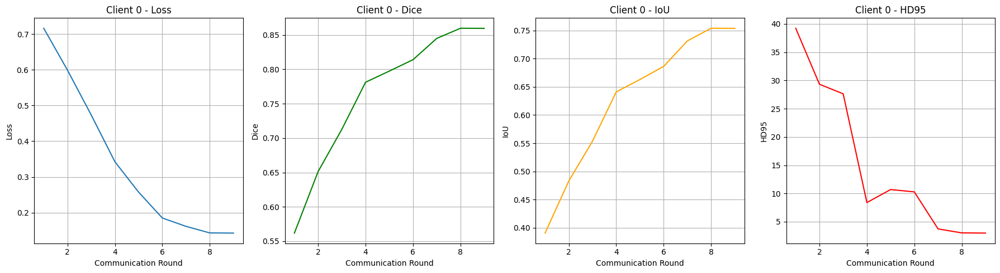

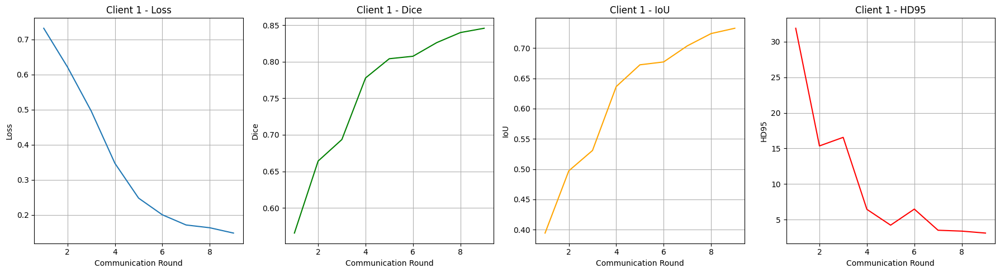

In [20]:
#local clients per communication round

for client_id, metrics in client_history.items():

    rounds = range(1, len(metrics["dice"]) + 1)

    plt.figure(figsize=(18, 5))

    # ----------------------------
    # Loss
    # ----------------------------
    plt.subplot(1, 4, 1)
    plt.plot(rounds, metrics["loss"])
    plt.xlabel("Communication Round")
    plt.ylabel("Loss")
    plt.title(f"Client {client_id} - Loss")
    plt.grid(True)

    # ----------------------------
    # Dice
    # ----------------------------
    plt.subplot(1, 4, 2)
    plt.plot(rounds, metrics["dice"], color="green")
    plt.xlabel("Communication Round")
    plt.ylabel("Dice")
    plt.title(f"Client {client_id} - Dice")
    plt.grid(True)

    # ----------------------------
    # IoU
    # ----------------------------
    plt.subplot(1, 4, 3)
    plt.plot(rounds, metrics["iou"], color="orange")
    plt.xlabel("Communication Round")
    plt.ylabel("IoU")
    plt.title(f"Client {client_id} - IoU")
    plt.grid(True)

    # ----------------------------
    # HD95
    # ----------------------------
    plt.subplot(1, 4, 4)
    plt.plot(rounds, metrics["hd95"], color="red")
    plt.xlabel("Communication Round")
    plt.ylabel("HD95")
    plt.title(f"Client {client_id} - HD95")
    plt.grid(True)

    plt.tight_layout()
    plt.show()

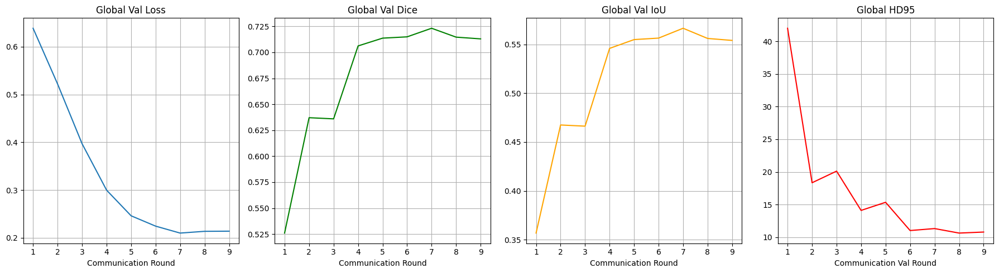

In [21]:
# Global Model per Communication Round
rounds = range(1, len(global_history["dice"]) + 1)

plt.figure(figsize=(18, 5))

plt.subplot(1,4,1)
plt.plot(rounds, global_history["loss"])
plt.xlabel("Communication Round")
plt.title("Global Val Loss")
plt.grid(True)

plt.subplot(1,4,2)
plt.plot(rounds, global_history["dice"], color="green")
plt.xlabel("Communication Round")
plt.title("Global Val Dice")
plt.grid(True)

plt.subplot(1,4,3)
plt.plot(rounds, global_history["iou"], color="orange")
plt.xlabel("Communication Round")
plt.title("Global Val IoU")
plt.grid(True)

plt.subplot(1,4,4)
plt.plot(rounds, global_history["hd95"], color="red")
plt.xlabel("Communication Val Round")
plt.title("Global HD95")
plt.grid(True)

plt.tight_layout()
plt.show()

**Test Set and Segmentation**

In [22]:
# -----------------------------
# 1️⃣ Load test set
# -----------------------------
test_dwi, test_masks = load_dwi_mask_pairs(os.path.join(data_dir, "test"))

test_dataset = ISLESDataset(
    dwi_files=test_dwi,
    mask_files=test_masks,
    transform=transform,
)

test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)
print("Test samples:", len(test_dataset))

# -----------------------------
# 2️⃣ Load best global model
# -----------------------------
best_model_ckpt = torch.load("best_global_model.pth")
global_model = create_model().to(device)
global_model.load_state_dict(best_model_ckpt["model_state_dict"])
global_model.eval()

# -----------------------------
# 3️⃣ Metrics setup
# -----------------------------
dice_metric = DiceMetric(include_background=False, reduction="mean")
hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

all_dice = []
all_hd95 = []
all_iou = []


# -----------------------------
# 4️⃣ Evaluate on test set
# -----------------------------
global_model.eval()
all_dice = []
all_hd95 = []
all_iou = []

with torch.no_grad():
    test_bar = tqdm(test_loader, desc="Testing", leave=True)
    for batch_idx, batch in enumerate(test_bar):
        images = batch["image"].to(device, dtype=torch.float32)
        masks = batch["mask"].to(device, dtype=torch.float32)

        outputs = global_model(images)
        pred_binary = (torch.sigmoid(outputs) > 0.5).float()

        # Metrics
        dice_metric(pred_binary, masks)
        hd_metric(pred_binary, masks)

        # Optional: show running metrics in tqdm
        running_dice = dice_metric.aggregate().item()
        running_hd = hd_metric.aggregate().item()
        running_iou = running_dice / (2 - running_dice)
        test_bar.set_postfix({
            "Dice": f"{running_dice:.4f}",
            "IoU": f"{running_iou:.4f}",
            "HD95": f"{running_hd:.4f}"
        })

    # Final metrics
    mean_dice = dice_metric.aggregate().item()
    mean_hd95 = hd_metric.aggregate().item()
    mean_iou = mean_dice / (2 - mean_dice)

    print(f"\nTest Set Metrics:")
    print(f"Dice: {mean_dice:.4f}")
    print(f"IoU: {mean_iou:.4f}")
    print(f"HD95: {mean_hd95:.4f}")

    # Reset metrics for future use
    dice_metric.reset()
    hd_metric.reset()

C:\Users\LAB.LAB12-PC14\AppData\Local\Temp\ipykernel_1816\837846673.py:18: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  best_model_ckpt = torch.load("best_global_model.pth"

Test samples: 29
SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
      )
      (1): ResBlock(
        (norm1): GroupNorm(8, 32, eps=1e-05, affine=True)
        (norm2): GroupNorm(8,

Testing: 100%|██████████| 29/29 [00:07<00:00,  4.10it/s, Dice=0.7106, IoU=0.5511, HD95=15.6710]


Test Set Metrics:
Dice: 0.7106
IoU: 0.5511
HD95: 15.6710


**Visualize**

29


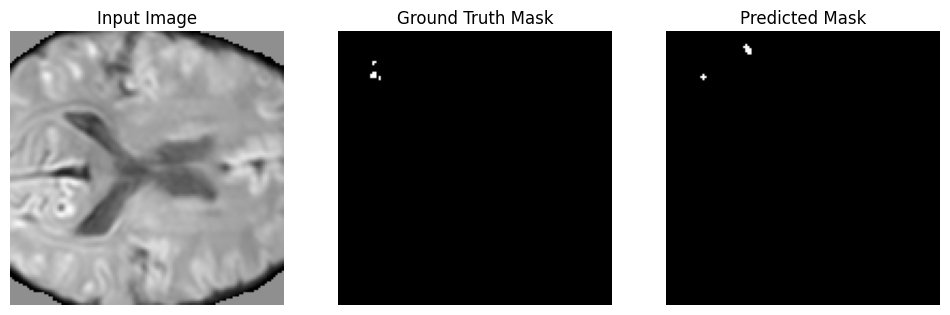

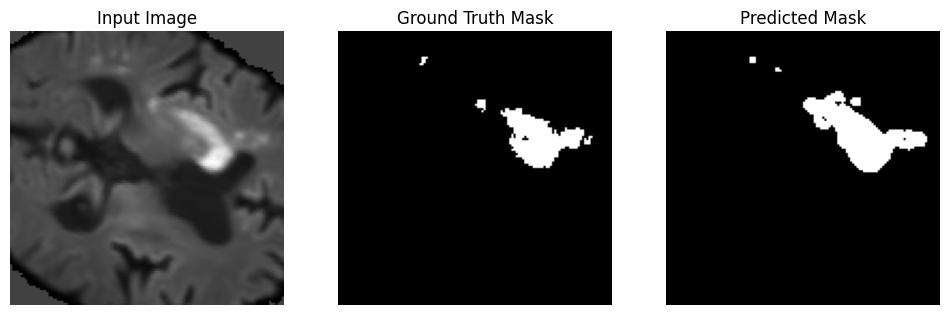

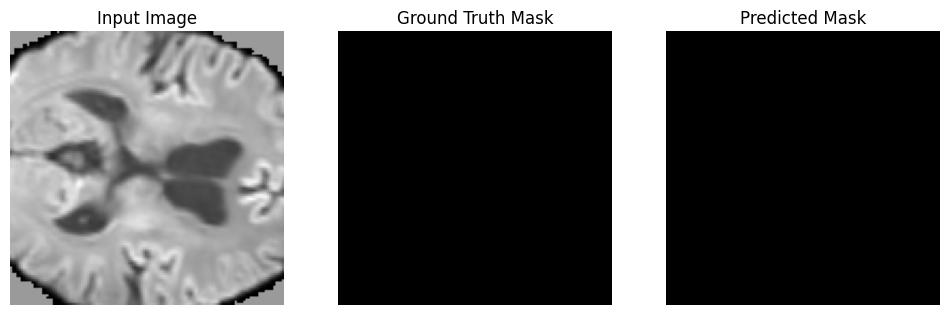

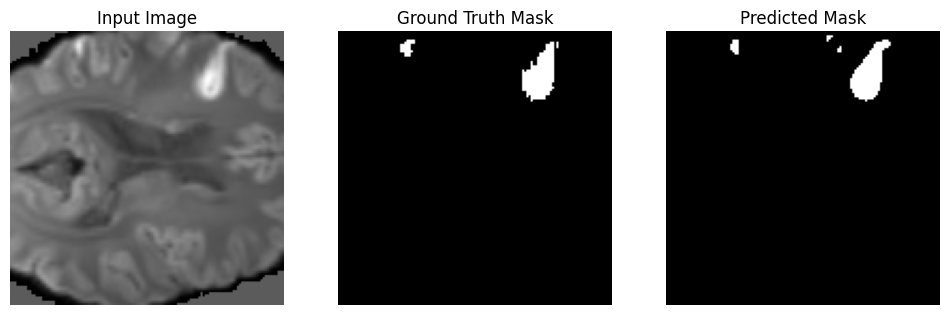

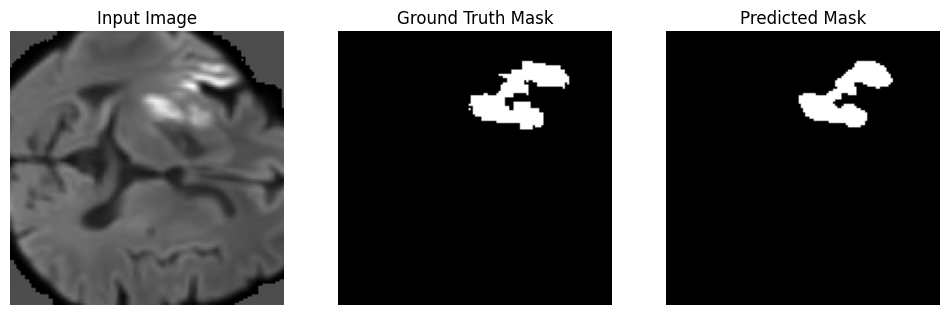

...

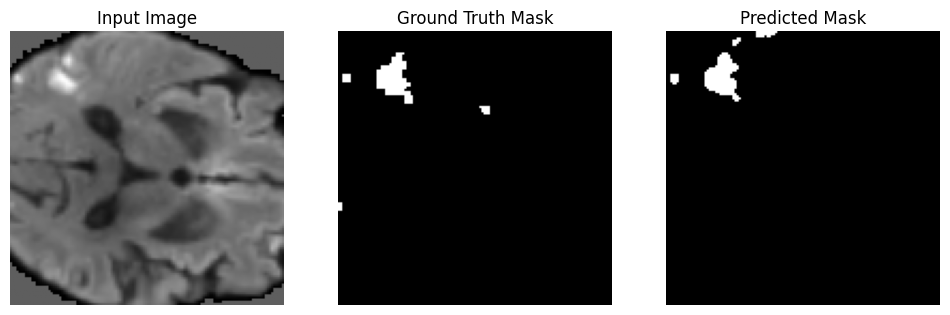

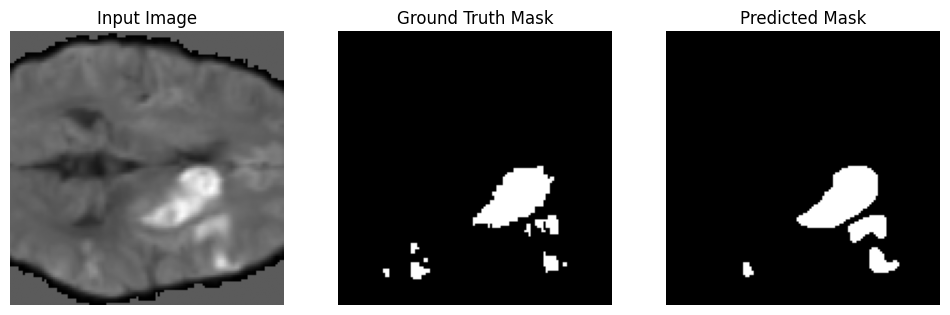

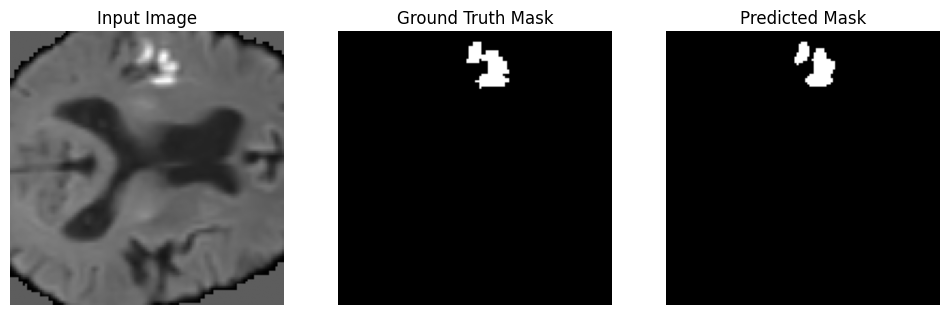

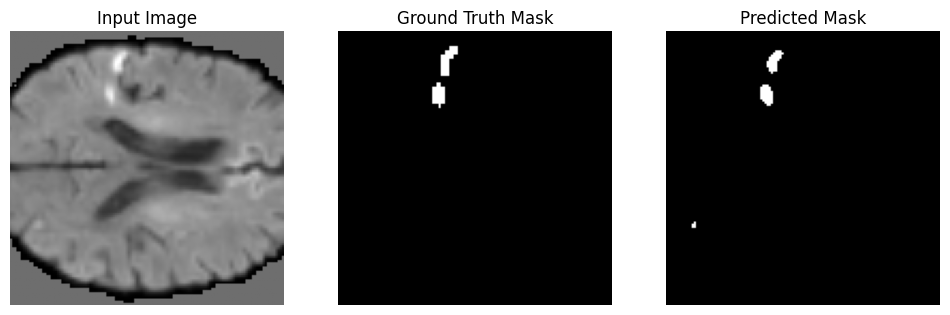

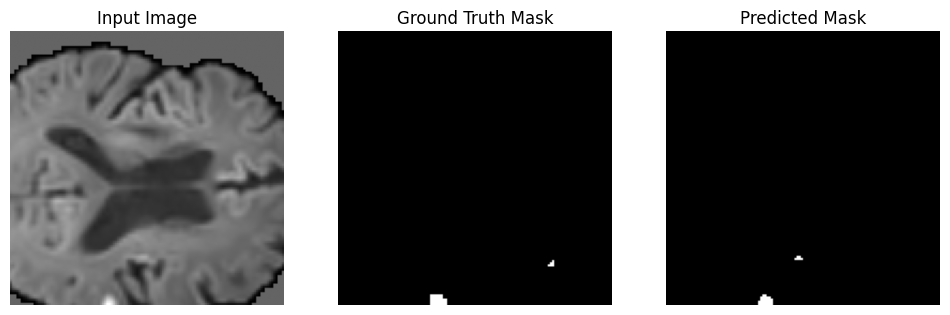

In [23]:
num_visualize = len(test_dataset)
print(num_visualize)

global_model.eval()

for i in range(num_visualize):
    sample = test_dataset[i]

    # Get tensors
    image_tensor = sample["image"].unsqueeze(0).to(device, dtype=torch.float32)
    mask_tensor  = sample["mask"]

    # Convert for visualization
    image = sample["image"][0].cpu().numpy()
    mask  = sample["mask"][0].cpu().numpy()

    # Predict
    with torch.no_grad():
        output = global_model(image_tensor)
        pred = (torch.sigmoid(output)[0, 0].cpu().numpy() > 0.5).astype(float)

    # Middle slice
    mid_slice = image.shape[2] // 2
    img_slice  = image[:, :, mid_slice]
    mask_slice = mask[:, :, mid_slice]
    pred_slice = pred[:, :, mid_slice]

    # Plot
    plt.figure(figsize=(12,4))

    plt.subplot(1,3,1)
    plt.imshow(img_slice, cmap="gray")
    plt.title("Input Image")
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(mask_slice, cmap="gray")
    plt.title("Ground Truth Mask")
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.imshow(pred_slice, cmap="gray")
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.show()